In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt

pd.set_option('display.max_rows', None)

# Dépendance pour le module de Corese-with-python
Nécessaire pour requêter en local avec le moteur Corese

In [2]:
# Corese execute
import atexit
import subprocess
from time import sleep
from py4j.java_gateway import JavaGateway
from py4j.java_collections import JavaMap

In [3]:
def sparqlQuery(graph, query):
    """Run a query on a graph

    :param graph: the graph on which the query is executed
    :param query: query to run
    :returns: query result
    """
    exec = QueryProcess.create(graph)
    return exec.query(query)


def load(path):
    """Load a graph from a local file or a URL

    :param path: local path or a URL
    :returns: the graph load
    """
    graph = Graph()

    ld = Load.create(graph)
    ld.parse(path)

    return graph

# Start java gateway
java_process = subprocess.Popen(
    ['java', '-jar', '-Dfile.encoding=UTF-8', 'corese-library-python-4.4.0.jar'])
sleep(1)
gateway = JavaGateway()

# Stop java gateway at the enf od script
def exit_handler():
    gateway.shutdown()
    print('\n' * 2)
    print('Gateway Server Stop!')

atexit.register(exit_handler)

# Import of class
Graph = gateway.jvm.fr.inria.corese.core.Graph
Load = gateway.jvm.fr.inria.corese.core.load.Load
Transformer = gateway.jvm.fr.inria.corese.core.transform.Transformer
QueryProcess = gateway.jvm.fr.inria.corese.core.query.QueryProcess
CoreseModel = gateway.jvm.fr.inria.corese.rdf4j.CoreseModel
SimpleValueFactory = gateway.jvm.org.eclipse.rdf4j.model.impl.SimpleValueFactory
RDF = gateway.jvm.org.eclipse.rdf4j.model.vocabulary.RDF

## Fonction de récupération  (English only) - String exact match

Récupère l'URI du concept en fonction du label fourni en paramètre et de son parent si renseigné.

Le label fourni doit être **égal** au label du concept dans le thésaurus TheZoo.

Le pramètre "parent_uri" est l'URI du parent du label dans la hiérarchie ou l'uri de la Collection dont le label fait parti.

In [4]:
def skos_english_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@en;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@en.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@en.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    elif candidate == []:
        return skos_english_only_contains(label_concept, parent_uri)
    else:
        return candidate


## Fonction de récupération  (French only) - String exact match

Récupère l'URI du concept en fonction du label fourni en paramètre et de son parent si renseigné.

Le label fourni doit être **égal** au label du concept dans le thésaurus TheZoo.

Le pramètre "parent_uri" est l'URI du parent du label dans la hiérarchie ou l'uri de la Collection dont le label fait parti.

In [5]:
def skos_french_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@fr;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@fr.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@fr.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    elif candidate == []:
        return skos_french_only_contains(label_concept, parent_uri)
    else:
        return candidate

## Fonction de récupération  (English only) - String contains in label

Récupère l'URI du concept en fonction du label fourni en paramètre et de son parent si renseigné.

Le label fourni doit être **contenu** (sub-string) dans le label du concept dans le thésaurus TheZoo.

Le pramètre "parent_uri" est l'URI du parent du label dans la hiérarchie ou l'uri de la Collection dont le label fait parti.

In [6]:
def skos_english_only_contains(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel ?label_concept;
                    skos:broader+ {parent_uri}.
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }} UNION {{
                ?concept skos:prefLabel ?label_concept.
                {parent_uri} skos:member ?concept.
                FILTER(lang(?label_concept)= "en")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel ?label_concept.
            FILTER(lang(?label_concept)= "en")
            FILTER(contains(str(?label_concept),"{label_concept}"))
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    return candidate


## Fonction de récupération  (French only) - String contains in label

Récupère l'URI du concept en fonction du label fourni en paramètre et de son parent si renseigné.

Le label fourni doit être **contenu** (sub-string) dans le label du concept dans le thésaurus TheZoo.

Le pramètre "parent_uri" est l'URI du parent du label dans la hiérarchie ou l'uri de la Collection dont le label fait parti.

In [7]:
def skos_french_only_contains(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel ?label_concept;
                    skos:broader+ {parent_uri};
                    a ?type.
                FILTER(lang(?label_concept)= "fr")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }} UNION {{
                ?concept skos:prefLabel ?label_concept.
                {parent_uri} skos:member ?concept.
                FILTER(lang(?label_concept)= "fr")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel ?label_concept.
            FILTER(lang(?label_concept)= "fr")
            FILTER(contains(str(?label_concept),"{label_concept}"))
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        print("AMBIGU! No Parent")
        print(f"{label_concept}\n{candidate}\n")
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    return candidate

## Fonction d'extraction des labels des commentaires

La fonction extrait les labels de concept renseigné dans les commentaires.

Les différents pattern possibles sont les suivants:
- "concept"
- "concept : sous-concept"
- "concept1 ; concept2"
- "concept1 : sous-concept1; concept2 : sous-concept1"
- "concept1 : sous-concept1, sous-concept2" 
*note: certain label du thésaurus comporte une virgule*

La fonction considère d'abord le label comme étant parfaitement renseigné sans erreurs en anglais.

La procédure de récupération des URI est la suivante:
   - Si le label est <u>égal</u> au label du thésaurus **en anglais** => ajouté dans les labels trouvés
   - Sinon:
        - Si le label est <u>égal</u> au label du thésaurus **en français** => ajouté dans les labels trouvés
        - Sinon:
            - Si le label est <u>une sous-chaine</u> du label du thésaurus **en anglais** => ajouté dans les labels trouvés
            - Sinon:
                - Si le label est <u>une sous-chaine</u> du label du thésaurus **en français** => ajouté dans les labels trouvés
                - Sinon:
                    - Le label est ajouté au fichier d'erreur

In [8]:
def concept_uri_retrieve(row, data_list, error_list):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        parent = ""
        for sub_concept in clean_elt.split(":"):
            clean_sub_concept = sub_concept.strip()
            # Try URI retrieve English only extact string then contains string (substring of)
            result = skos_english_only_exact(clean_sub_concept, parent)
            if isinstance(result, str):
                parent = result
                data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif result == []:
                # Try URI retrieve French only extact string then contains string (substring of)
                result = skos_french_only_exact(clean_sub_concept, parent)
                if isinstance(result, str):
                    parent = result
                    data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                #elif result == []:
                    #print(f"""First step not success.{parent if parent != "" else "no parent"} : {clean_sub_concept} not found => {result}""")
            # Maybe multiple concept in element
            if result == []:
                for clean_spread_concept in clean_sub_concept.split(","):
                    clean_label_spread = clean_spread_concept.strip()
                    result = skos_english_only_exact(clean_sub_concept, parent)
                    if isinstance(result, str):
                        parent = result
                        data_list.append([id_annotation, result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                    if result == []:
                    # Try URI retrieve French only extact string then contains string (substring of)
                        result = skos_french_only_exact(clean_sub_concept, parent)
                        if isinstance(result, str):
                            parent = result
                            data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                        elif result == []:
                            #print(f"""First step not success.{parent if parent != "" else "no parent"} : {clean_sub_concept} not found => {result}""")
                            error_list.append(["not_found",clean_label_spread ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])

In [9]:
PREFIX = "prefix skos: <http://www.w3.org/2004/02/skos/core#>  ."
graph = load("th310.ttl")

comments = pd.read_csv("treatment.csv", sep=";").values.tolist()

# Scénario 1 : Pas de remise en question des annotations.
On suppose qu'aucune erreur dans l'annotation n'est présent et on considère que le label du commentaire est exactement le même que celui du thésaurus, les hierarchies sont respectées et justes.


In [10]:
def skos_english_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@en;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@en.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@en.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    else:
        return candidate

In [11]:
def scenario1(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            clean_sub_concept = sub_concept.strip()
            if clean_sub_concept == "":
                continue
            # Try URI retrieve English only extact string then contains string (substring of)
            result = skos_english_only_exact(clean_sub_concept, parent)
            if isinstance(result, str):
                parent = result
                data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif result == []:   
                error_list.append(["not_found",clean_sub_concept ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif isinstance(result, list) and len(result) > 1:
                ambigous.append(["Ambigous",clean_sub_concept, result ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])

[10697, 3825, 0]


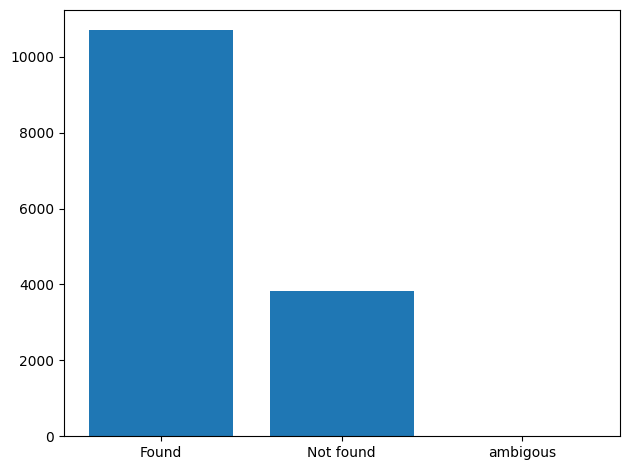

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,not_found,ancient class,0,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : bird,avium,avium,16,21,5
1,not_found,bird,0,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : bird,avium,avium,16,21,5
2,not_found,absolute,1,1,"Sequitur natura avium, quarum grandissimi et p...",10,size: absolute,grandissimi,grandissimi,30,41,11
3,not_found,ancient class,2,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class: beast,paene bestiarum generis,paene bestiarum generis,45,68,23
4,not_found,beast,2,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class: beast,paene bestiarum generis,paene bestiarum generis,45,68,23
5,not_found,place,3,1,"Sequitur natura avium, quarum grandissimi et p...",10,place : Africa,Africi,Africi,83,89,6
6,not_found,place,4,1,"Sequitur natura avium, quarum grandissimi et p...",10,place: Ethiopia,Aethiopici,Aethiopici,94,104,10
7,not_found,relative,6,1,"Sequitur natura avium, quarum grandissimi et p...",10,size : relative,"altitudinem equitis insidentis equo excedunt,","altitudinem equitis insidentis equo excedunt,",105,150,45
8,not_found,relative,7,1,"Sequitur natura avium, quarum grandissimi et p...",10,speed : relative; horse,"celeritatem vincunt,","celeritatem vincunt,",151,171,20
9,not_found,ancient class,9,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : flying animal,cetero non sunt volucres nec a terra attolluntur,cetero non sunt volucres nec a terra attolluntur,222,270,48


,type,concept_search,result,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size


In [12]:
annotated_list_extraction = []
not_found = []
ambigous = []
for row in comments:
    scenario1(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values1 = [len(annotated_list_extraction), len(not_found), len(ambigous)]
original_value = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found1 = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "result","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

plt.bar(labels, values1)
plt.tight_layout()
plt.savefig('stats/scenario1.png')
print(values1)
plt.show()
display(df_not_found1)
display(df_ambigous)

# Scénario 2 : Possible erreurs de langue dans les labels des commentaires
On considère toujours les labels et les hiérarchies comme justes mais il est possible qu'un label français est pu être utilisé.

In [13]:
def skos_english_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@en;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@en.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@en.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    else:
        return candidate

def skos_french_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@fr;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@fr.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@fr.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    else:
        return candidate

In [14]:
def scenario2(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            clean_sub_concept = sub_concept.strip()
            if clean_sub_concept == "":
                continue
            # Try URI retrieve English only extact string then contains string (substring of)
            result = skos_english_only_exact(clean_sub_concept, parent)
            if isinstance(result, str):
                parent = result
                data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif result == []:
                result = skos_french_only_exact(clean_sub_concept, parent)
                if isinstance(result, str):
                    parent = result
                    data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                elif result == []:
                    error_list.append(["not_found",clean_sub_concept ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                elif isinstance(result, list) and len(result) > 1:
                    ambigous.append(["Ambigous",clean_sub_concept, result ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif isinstance(result, list) and len(result) > 1:
                ambigous.append(["Ambigous",clean_sub_concept, result ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])

[10801, 3663, 58]


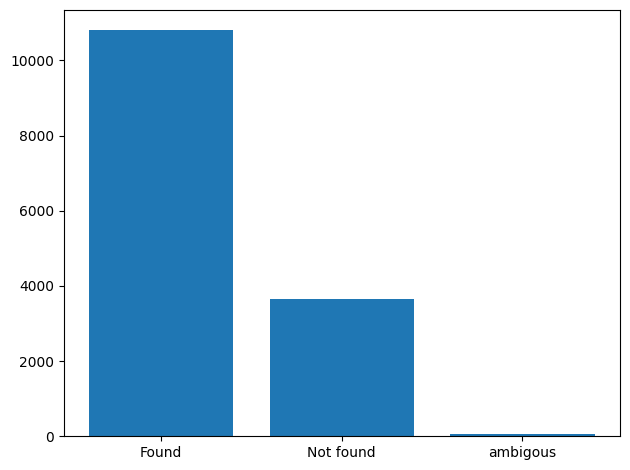

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,not_found,ancient class,0,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : bird,avium,avium,16,21,5
1,not_found,bird,0,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : bird,avium,avium,16,21,5
2,not_found,absolute,1,1,"Sequitur natura avium, quarum grandissimi et p...",10,size: absolute,grandissimi,grandissimi,30,41,11
3,not_found,ancient class,2,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class: beast,paene bestiarum generis,paene bestiarum generis,45,68,23
4,not_found,beast,2,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class: beast,paene bestiarum generis,paene bestiarum generis,45,68,23
5,not_found,place,3,1,"Sequitur natura avium, quarum grandissimi et p...",10,place : Africa,Africi,Africi,83,89,6
6,not_found,place,4,1,"Sequitur natura avium, quarum grandissimi et p...",10,place: Ethiopia,Aethiopici,Aethiopici,94,104,10
7,not_found,relative,6,1,"Sequitur natura avium, quarum grandissimi et p...",10,size : relative,"altitudinem equitis insidentis equo excedunt,","altitudinem equitis insidentis equo excedunt,",105,150,45
8,not_found,relative,7,1,"Sequitur natura avium, quarum grandissimi et p...",10,speed : relative; horse,"celeritatem vincunt,","celeritatem vincunt,",151,171,20
9,not_found,ancient class,9,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : flying animal,cetero non sunt volucres nec a terra attolluntur,cetero non sunt volucres nec a terra attolluntur,222,270,48


,type,concept_search,result,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,316,27,educat ergo subditum adulterato feta nido. ill...,10,cuisine ; ancient class : bird,nulla tunc avium suavitate carnis comparatur illi,nulla tunc avium suavitate carnis comparatur illi,355,404,49
1,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,426,37,cliviam quoque avem ab antiquis nominatam anim...,10,cuisine,"quae nunc defecisse mirum est, cum abundent et...","quae nunc defecisse mirum est, cum abundent et...",261,338,77
2,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,504,45,Pavonem cibi gratia Romae primus occidit orato...,10,cuisine,Pavonem cibi gratia Romae primus occidit orato...,Pavonem cibi gratia Romae primus occidit orato...,0,84,84
3,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,576,52,"Nostri sapientiores, qui eos iecoris bonitate ...",10,cuisine,"Nostri sapientiores, qui eos iecoris bonitate ...","Nostri sapientiores, qui eos iecoris bonitate ...",0,473,473
4,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,596,56,"Anserini generis sunt chenalopeces et, quibus ...",10,cuisine,lautiores epulas,lautiores epulas,46,62,16
5,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,613,56,"Anserini generis sunt chenalopeces et, quibus ...",10,"cuisine ; animal reserve, vivarium",in vivariis saporem perdunt,in vivariis saporem perdunt,442,469,27
6,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,623,57,moriuntur contumacia spiritu revocato. proxima...,10,cuisine,damnatas in cibis; emissa enim ossibus medulla...,damnatas in cibis; emissa enim ossibus medulla...,109,188,79
7,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,651,60,"certum est, Pontum transvolaturas primum omniu...",10,cuisine,cum scriberet turdos paulo ante coeptos sagina...,cum scriberet turdos paulo ante coeptos sagina...,288,450,162
8,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,727,69,quod si ventus agmen adverso flatu coepit inhi...,10,cuisine,"veneni semen gratissimus cibus, quam ob causam...","veneni semen gratissimus cibus, quam ob causam...",143,210,67
9,Ambigous,cuisine,[<https://opentheso.huma-num.fr/?idc=pcrtAWMnN...,789,74,Auctores sunt omnibus annis advolare Ilium ex ...,10,cuisine,quae novissimae sunt peregrinarum avium in men...,quae novissimae sunt peregrinarum avium in men...,346,427,81


In [15]:
annotated_list_extraction = []
not_found = []
ambigous = []
for row in comments:
    scenario2(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values2 = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "result","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

plt.bar(labels, values2)
plt.tight_layout()
plt.savefig('stats/scenario2.png')
print(values2)
plt.show()
display(df_not_found)
display(df_ambigous)

# Scénario 3 : Le label du concept est peut-être incomplet
On considère que le label du concept n'est pas complet si les deux premiers scénario ne donne rien.

In [16]:
def skos_english_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@en;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@en.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@en.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    else:
        return skos_english_only_contains(label_concept, parent_uri)

def skos_english_only_contains(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel ?label_concept;
                    skos:broader+ {parent_uri}.
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }} UNION {{
                ?concept skos:prefLabel ?label_concept.
                {parent_uri} skos:member ?concept.
                FILTER(lang(?label_concept)= "en")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel ?label_concept.
            FILTER(lang(?label_concept)= "en")
            FILTER(contains(str(?label_concept),"{label_concept}"))
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    return candidate


def skos_french_only_exact(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel "{label_concept}"@fr;
                    skos:broader+ {parent_uri}.
            }} UNION {{
                ?concept skos:prefLabel "{label_concept}"@fr.
                {parent_uri} skos:member ?concept.
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel "{label_concept}"@fr.
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    else:
        return skos_french_only_contains(label_concept, parent_uri)

def skos_french_only_contains(label_concept, parent_uri=""):
    if parent_uri != "":
        sparql_query = f"""{PREFIX}
        SELECT ?concept WHERE {{
            {{
                ?concept skos:prefLabel ?label_concept;
                    skos:broader+ {parent_uri};
                    a ?type.
                FILTER(lang(?label_concept)= "fr")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }} UNION {{
                ?concept skos:prefLabel ?label_concept.
                {parent_uri} skos:member ?concept.
                FILTER(lang(?label_concept)= "fr")
                FILTER(contains(str(?label_concept),"{label_concept}"))
            }}
        }}
        """
    else:
        sparql_query = f"""{PREFIX}
        SELECT * WHERE {{
            ?concept skos:prefLabel ?label_concept.
            FILTER(lang(?label_concept)= "fr")
            FILTER(contains(str(?label_concept),"{label_concept}"))
        }}
        """
    query_result = sparqlQuery(graph, sparql_query)
    candidate = list(set([x.getValue("?concept").toString() for x in query_result.getMappingList()]))
    if len(candidate) > 1:
        return candidate
    if len(candidate) > 0:
        return candidate[0]
    return candidate

In [17]:
def scenario3(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    amb = 0
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            clean_sub_concept = sub_concept.strip()
            if clean_sub_concept == "":
                continue
            # Try URI retrieve English only extact string then contains string (substring of)
            result = skos_english_only_exact(clean_sub_concept, parent)
            if isinstance(result, str):
                parent = result
                data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            elif result == []:
                result = skos_french_only_exact(clean_sub_concept, parent)
                if isinstance(result, str):
                    parent = result
                    data_list.append([id_annotation, result,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                elif result == []:
                    error_list.append(["not_found",clean_sub_concept ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                elif isinstance(result, list) and len(result) > 1:
                    amb += 1
            elif isinstance(result, list) and len(result) > 1:
                amb += 1
        if amb > 0:
            ambigous.append(["Ambigous",clean_sub_concept, id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])

[11322, 0, 2923]


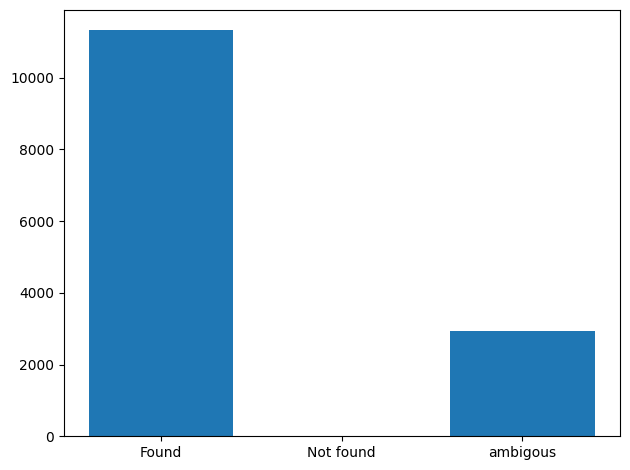

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size


,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,Ambigous,bird,0,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : bird,avium,avium,16,21,5
1,Ambigous,beast,2,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class: beast,paene bestiarum generis,paene bestiarum generis,45,68,23
2,Ambigous,Africa,3,1,"Sequitur natura avium, quarum grandissimi et p...",10,place : Africa,Africi,Africi,83,89,6
3,Ambigous,Ethiopia,4,1,"Sequitur natura avium, quarum grandissimi et p...",10,place: Ethiopia,Aethiopici,Aethiopici,94,104,10
4,Ambigous,flying animal,9,1,"Sequitur natura avium, quarum grandissimi et p...",10,ancient class : flying animal,cetero non sunt volucres nec a terra attolluntur,cetero non sunt volucres nec a terra attolluntur,222,270,48
5,Ambigous,deer,10,1,"Sequitur natura avium, quarum grandissimi et p...",10,similarity to another animal : deer,cervinis similes,cervinis similes,284,300,16
6,Ambigous,Ethiopia,23,3,Aethiopes atque Indi discolores maxime et inen...,10,place : Ethiopia,Aethiopes,Aethiopes,0,9,9
7,Ambigous,India,24,3,Aethiopes atque Indi discolores maxime et inen...,10,place : India,Indi,Indi,16,20,4
8,Ambigous,bird,26,3,Aethiopes atque Indi discolores maxime et inen...,10,ancient class : bird,Aethiopes atque Indi discolores maxime et inen...,Aethiopes atque Indi discolores maxime et inen...,0,67,67
9,Ambigous,Arabia,27,3,Aethiopes atque Indi discolores maxime et inen...,10,place : Arabia,Arabiae,Arabiae,90,97,7


In [18]:
annotated_list_extraction = []
not_found, ambigous = [], []
for row in comments:
    scenario3(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values3 = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

plt.bar(labels, values3)
plt.tight_layout()
plt.savefig('stats/scenario3.png')
print(values3)
plt.show()
display(df_not_found)
display(df_ambigous)

# Scénario 4 : Le label ne respect pas la casse

In [19]:
def label_treat(label, parent, row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    
    # Try URI retrieve English only extact string then contains string (substring of)
    cases = [label, label.capitalize(), label.lower(), label.upper()]
    amb = 0
    for c in cases:
        result = skos_english_only_exact(c, parent)
    
        if isinstance(result, str):
            data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            return result
    
        elif result == []:
            result = skos_french_only_exact(c, parent)
        
            if isinstance(result, str):
                data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                return result
            elif len(result) > 1:
                amb += 1
        elif len(result) > 1:
            amb += 1
    if amb > 0:
        ambigous.append(["Ambigous", label, id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
    else:
        error_list.append(["not_found",label ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
    return parent

In [20]:
def scenario4(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            if sub_concept == "":
                continue
            parent = label_treat(sub_concept.strip(), parent, row, data_list, error_list, ambigous)
            

[12238, 1840, 444]


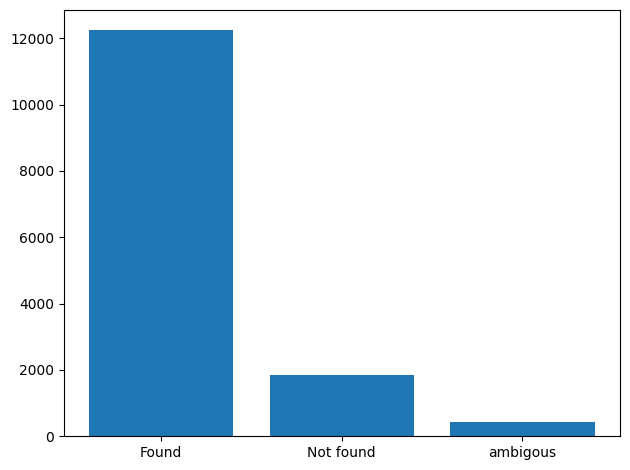

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,not_found,deer,10,1,"Sequitur natura avium, quarum grandissimi et p...",10,similarity to another animal : deer,cervinis similes,cervinis similes,284,300,16
1,not_found,from dead body??,46,4,primus atque diligentissime togatorum de eo pr...,10,spontaneous generation : from dead body??,ex ossibus deinde et medullis eius nasci primo...,ex ossibus deinde et medullis eius nasci primo...,291,352,61
2,not_found,Panchaia,49,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Panchaia,prope Panchaiam,prope Panchaiam,0,15,15
3,not_found,Heliopolis,50,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Heliopolis,in Solis urbem,in Solis urbem,16,30,14
4,not_found,"Cornelius, Cnaeus",55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
5,not_found,1st. c. BCE,55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
6,not_found,1st. c. BCE?? problemas de identificación,57,4,primus atque diligentissime togatorum de eo pr...,10,historical character : Manilius ; 1st. c. BCE?...,primus atque diligentissime togatorum de eo pr...,primus atque diligentissime togatorum de eo pr...,0,436,436
7,not_found,1st. c. BCE?? problemas de identificación,57,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character : Manilius ; 1st. c. BCE?...,primus atque diligentissime togatorum de eo pr...,prope Panchaiam in Solis urbem et in ara ibi d...,0,346,346
8,not_found,1st c. CE,60,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,"historical character : politician ; Plautius, ...",Q. Plautio Sex. Papinio cos,Q. Plautio Sex. Papinio cos,409,436,27
9,not_found,"Valerianus, Cornelius",61,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,"intellectual authority : Valerianus, Cornelius",Cornelius Valerianus phoenicem devolavisse in ...,Cornelius Valerianus phoenicem devolavisse in ...,347,437,90


,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,Ambigous,Egypt,59,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Egypt,in Aegyptum,in Aegyptum,390,401,11
1,Ambigous,Apolo,86,7,"conversatur autem in montibus, secundi generis...",10,Apolo,Apollinis dicta filia,Apollinis dicta filia,238,259,21
2,Ambigous,sea,116,8,"quarti generis est percnopterus, eadem oripela...",10,habitat : sea,in mari,in mari,514,521,7
3,Ambigous,,153,11,"haliaºti suum genus non habent, sed ex diverso...",10,; bearded vulture,"in ossifragis genus habet, e quibus vultures m...","in ossifragis genus habet, e quibus vultures m...",108,216,108
4,Ambigous,dragon,206,17,Primo et secundo generi non minorum tantum qua...,10,dragon ; enmity ; fight,nec unus hostis illi satis: est acrior cum dra...,nec unus hostis illi satis: est acrior cum dra...,211,466,255
5,Ambigous,solidarity between man and animal,277,23,In Thraciae parte super Amphipolim homines et ...,10,solidarity between man and animal,In Thraciae parte super Amphipolim homines et ...,In Thraciae parte super Amphipolim homines et ...,0,451,451
6,Ambigous,,310,27,educat ergo subditum adulterato feta nido. ill...,10,parasitism ; education of offspring ; nest ;,educat ergo subditum adulterato feta nido,educat ergo subditum adulterato feta nido,0,41,41
7,Ambigous,cuisine,316,27,educat ergo subditum adulterato feta nido. ill...,10,cuisine ; ancient class : bird,nulla tunc avium suavitate carnis comparatur illi,nulla tunc avium suavitate carnis comparatur illi,355,404,49
8,Ambigous,swallow,329,28,Milui ex eodem accipitrum genere magnitudine d...,10,swallow ; migration,non tamen ante hirundinem abeuntes,non tamen ante hirundinem abeuntes,413,447,34
9,Ambigous,,331,28,Milui ex eodem accipitrum genere magnitudine d...,10,animal disease :,podagra,podagra,488,495,7


In [21]:
annotated_list_extraction = []
not_found, ambigous = [], []
for row in comments:
    scenario4(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values4 = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

plt.bar(labels, values4)
plt.tight_layout()
plt.savefig('stats/scenario4.png')
print(values4)
plt.show()
display(df_not_found)
display(df_ambigous)

# Scenario 5 : La hierarchie n'est pas correct

In [22]:
def label_treat(label, parent, row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    
    # Try URI retrieve English only extact string then contains string (substring of)
    cases = [label, label.capitalize(), label.lower(), label.upper()]
    
    amb = 0
    for c in cases:
        result = skos_english_only_exact(c, parent)
    
        if isinstance(result, str):
            data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            return result
    
        elif result == []:
            result = skos_french_only_exact(c, parent)
        
            if isinstance(result, str):
                data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                return result
            elif len(result) > 1:
                amb += 1
        elif len(result) > 1:
            amb += 1
            
    amb = 0
    for c in cases:
        result = skos_english_only_exact(c, "")
    
        if isinstance(result, str):
            data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            return result
    
        elif result == []:
            result = skos_french_only_exact(c, "")
        
            if isinstance(result, str):
                data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                return result
            elif len(result) > 1:
                amb += 1
                continue
        elif len(result) > 1:
            amb += 1
            continue
    if amb > 0:
        ambigous.append(["Ambigous", label, id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
    else:
        error_list.append(["not_found",label ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
    return parent

In [23]:
def scenario5(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            if sub_concept == "":
                continue
            parent = label_treat(sub_concept.strip(), parent, row, data_list, error_list, ambigous)
            

[12520, 1544, 458]


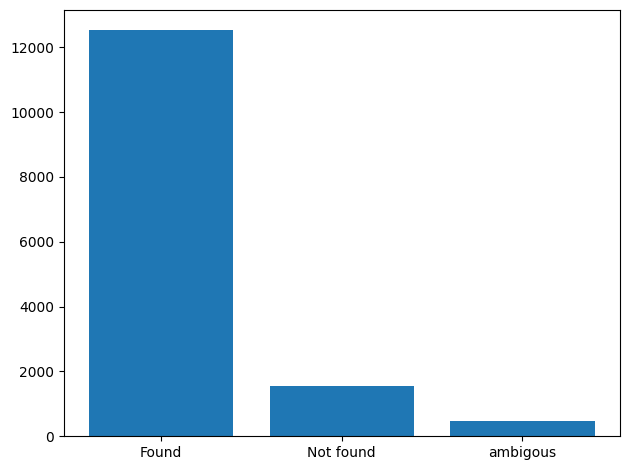

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,not_found,from dead body??,46,4,primus atque diligentissime togatorum de eo pr...,10,spontaneous generation : from dead body??,ex ossibus deinde et medullis eius nasci primo...,ex ossibus deinde et medullis eius nasci primo...,291,352,61
1,not_found,Panchaia,49,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Panchaia,prope Panchaiam,prope Panchaiam,0,15,15
2,not_found,Heliopolis,50,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Heliopolis,in Solis urbem,in Solis urbem,16,30,14
3,not_found,"Cornelius, Cnaeus",55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
4,not_found,1st. c. BCE,55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
5,not_found,1st. c. BCE?? problemas de identificación,57,4,primus atque diligentissime togatorum de eo pr...,10,historical character : Manilius ; 1st. c. BCE?...,primus atque diligentissime togatorum de eo pr...,primus atque diligentissime togatorum de eo pr...,0,436,436
6,not_found,1st. c. BCE?? problemas de identificación,57,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character : Manilius ; 1st. c. BCE?...,primus atque diligentissime togatorum de eo pr...,prope Panchaiam in Solis urbem et in ara ibi d...,0,346,346
7,not_found,1st c. CE,60,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,"historical character : politician ; Plautius, ...",Q. Plautio Sex. Papinio cos,Q. Plautio Sex. Papinio cos,409,436,27
8,not_found,1st c. CE,63,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character : politician : Claudius ;...,Claudii principis censura anno urbis DCCC,Claudii principis censura anno urbis DCCC,462,503,41
9,not_found,other kind of public exhibition,64,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,other kind of public exhibition,in comitio propositus,in comitio propositus,507,528,21


,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,Ambigous,Egypt,59,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Egypt,in Aegyptum,in Aegyptum,390,401,11
1,Ambigous,absolute,68,6,"Ex his quas novimus aquilae maximus honos, max...",10,force : absolute,maxima et vis,maxima et vis,43,56,13
2,Ambigous,absolute,70,6,"Ex his quas novimus aquilae maximus honos, max...",10,force : absolute,viribus praecipua,viribus praecipua,141,158,17
3,Ambigous,relative,84,7,"conversatur autem in montibus, secundi generis...",10,force : relative ; pygargus2,et vi,et vi,198,203,5
4,Ambigous,Apolo,86,7,"conversatur autem in montibus, secundi generis...",10,Apolo,Apollinis dicta filia,Apollinis dicta filia,238,259,21
5,Ambigous,,153,11,"haliaºti suum genus non habent, sed ex diverso...",10,; bearded vulture,"in ossifragis genus habet, e quibus vultures m...","in ossifragis genus habet, e quibus vultures m...",108,216,108
6,Ambigous,dragon,206,17,Primo et secundo generi non minorum tantum qua...,10,dragon ; enmity ; fight,nec unus hostis illi satis: est acrior cum dra...,nec unus hostis illi satis: est acrior cum dra...,211,466,255
7,Ambigous,solidarity between man and animal,277,23,In Thraciae parte super Amphipolim homines et ...,10,solidarity between man and animal,In Thraciae parte super Amphipolim homines et ...,In Thraciae parte super Amphipolim homines et ...,0,451,451
8,Ambigous,,310,27,educat ergo subditum adulterato feta nido. ill...,10,parasitism ; education of offspring ; nest ;,educat ergo subditum adulterato feta nido,educat ergo subditum adulterato feta nido,0,41,41
9,Ambigous,cuisine,316,27,educat ergo subditum adulterato feta nido. ill...,10,cuisine ; ancient class : bird,nulla tunc avium suavitate carnis comparatur illi,nulla tunc avium suavitate carnis comparatur illi,355,404,49


In [24]:
annotated_list_extraction = []
not_found, ambigous = [], []
for row in comments:
    scenario5(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values5 = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

plt.bar(labels, values5)
plt.tight_layout()
plt.savefig('stats/scenario5.png')
print(values5)
plt.show()
display(df_not_found)
display(df_ambigous)

# Scenario 6 : Il y a plusieurs concepts renseignés.

concept: 2 sous_concept1, sous-concept2

In [25]:
def label_treat(label, parent, row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    
    # Try URI retrieve English only extact string then contains string (substring of)
    cases = [label, label.capitalize(), label.lower(), label.upper()]
    amb = 0
    for c in cases:
        result = skos_english_only_exact(c, parent)
    
        if isinstance(result, str):
            data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            return result
        elif len(result) > 1:
            amb += 1
            continue
        elif result == []:
            result = skos_french_only_exact(c, parent)
        
            if isinstance(result, str):
                data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                return result
            elif len(result) > 1:
                amb += 1
                continue
    amb = 0
    for c in cases:
        result = skos_english_only_exact(c, "")
    
        if isinstance(result, str):
            data_list.append([id_annotation, c, result, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            return result
        elif len(result) > 1:
            amb += 1
            continue
        elif result == []:
            result = skos_french_only_exact(c, "")
        
            if isinstance(result, str):
                data_list.append([id_annotation, c,result,paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
                return result
            elif len(result) > 1:
                amb += 1
                continue
    if amb > 0:
        error_list.append(["not_found",label ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
    return parent

In [26]:
def scenario6(row, data_list, error_list, ambigous):
    id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size = row
    for elt in str(concepts).split(";"):
        clean_elt = elt.strip().replace("\r","")
        if clean_elt == "":
            continue
        parent = ""
        for sub_concept in clean_elt.split(":"):
            if sub_concept == "":
                continue
            res = label_treat(sub_concept.strip(), parent, row, data_list, error_list, ambigous)
            if res == parent:
                if len(sub_concept.strip().split(",")) > 1 :
                    for spread_concept in sub_concept.strip().split(","):
                        res = label_treat(spread_concept.strip(), parent, row, data_list, error_list, ambigous)
                        if res == parent:
                            error_list.append(["not_found",sub_concept ,id_annotation, paragraph_id, paragraph_text, chapter, concepts, mention, common_text, start, end, size])
            parent = res
                        

[12547, 512, 0]


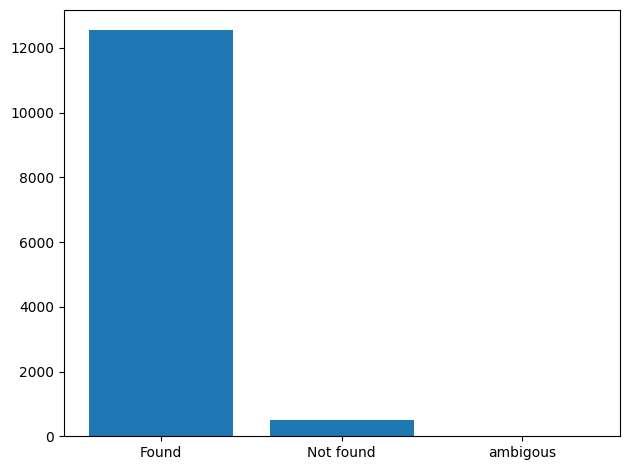

,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size
0,not_found,Cornelius,55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
1,not_found,"Cornelius, Cnaeus",55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
2,not_found,Cnaeus,55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
3,not_found,"Cornelius, Cnaeus",55,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,historical character ; homme politique ; Crass...,P. Licinio Cn. Cornelio,P. Licinio Cn. Cornelio,312,335,23
4,not_found,Egypt,59,5,prope Panchaiam in Solis urbem et in ara ibi d...,10,place : Egypt,in Aegyptum,in Aegyptum,390,401,11
5,not_found,absolute,68,6,"Ex his quas novimus aquilae maximus honos, max...",10,force : absolute,maxima et vis,maxima et vis,43,56,13
6,not_found,absolute,70,6,"Ex his quas novimus aquilae maximus honos, max...",10,force : absolute,viribus praecipua,viribus praecipua,141,158,17
7,not_found,relative,84,7,"conversatur autem in montibus, secundi generis...",10,force : relative ; pygargus2,et vi,et vi,198,203,5
8,not_found,Apolo,86,7,"conversatur autem in montibus, secundi generis...",10,Apolo,Apollinis dicta filia,Apollinis dicta filia,238,259,21
9,not_found,,153,11,"haliaºti suum genus non habent, sed ex diverso...",10,; bearded vulture,"in ossifragis genus habet, e quibus vultures m...","in ossifragis genus habet, e quibus vultures m...",108,216,108


,type,concept_search,id_annotation,paragraph_id,paragraph_text,chapter,concepts,mention,common_text,start,end,size


In [27]:
annotated_list_extraction = []
not_found, ambigous = [], []
for row in comments:
    scenario6(row, annotated_list_extraction, not_found, ambigous)

labels = ["Found", "Not found", "ambigous"]
values6 = [len(annotated_list_extraction), len(not_found), len(ambigous)]

df_not_found = pd.DataFrame(not_found, columns=[
    "type","concept_search","id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])

df_ambigous = pd.DataFrame(ambigous, columns=[
    "type","concept_search", "id_annotation", "paragraph_id", "paragraph_text", "chapter", "concepts", "mention", "common_text", "start", "end", "size"
])


plt.bar(labels, values6)
plt.tight_layout()
plt.savefig('stats/scenario6.png')
print(values6)
plt.show()
display(df_not_found)
display(df_ambigous)

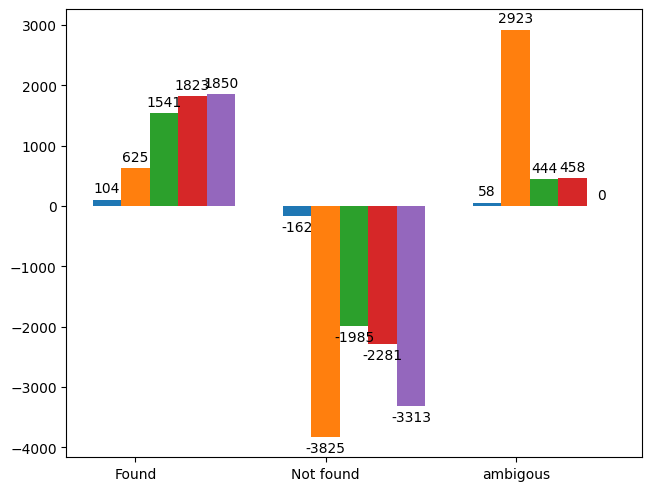

In [28]:
import numpy as np

def differences(new, old):
    return list(map(lambda x,y: x - y, new, old))

t = [differences(values2, original_value), differences(values3, original_value), differences(values4, original_value), differences(values5, original_value), differences(values6, original_value)]

x = np.arange(3)  # the label locations
fig, ax = plt.subplots(layout='constrained')
width = 0.15
multiplier = 0
for v in t:
    offset = width * multiplier
    rects = ax.bar(x + offset + width, tuple(v), width)
    ax.bar_label(rects, padding=3)
    multiplier += 1


ax.set_xticks(x + width * 2, labels)
#ax.legend(loc='upper left', ncols=)
#ax.set_ylim(0, 250)
plt.savefig('stats/global_view.png')
plt.show()